In [ ]:
!pip install boto3

In [24]:
import matplotlib.pyplot as plotter_lib
import numpy as np
import PIL as image_lib
import tensorflow as tflow
from tensorflow.keras.layers import Flatten
from keras.layers.core import Dense
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
import tensorflow as tf
import os
import time

In [25]:
tflow.debugging.set_log_device_placement(True)
AUTOTUNE = tflow.data.AUTOTUNE

In [ ]:
with tflow.device("/GPU:0"):
    gpu_time = time.time()
    # Test for gpu code
    # Create some tensors
    a = tflow.constant([[1.0, 2.0, 3.0], [4.0, 5.0, 6.0]])
    b = tflow.constant([[1.0, 2.0], [3.0, 4.0], [5.0, 6.0]])
    c = tflow.matmul(a, b)
    gpu_time = time.time() - gpu_time
    print("GPU time for basic tensor operation: {} seconds".format(gpu_time))

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op MatMul in device /job:localhost/replica:0/task:0/device:GPU:0
GPU time for basic tensor operation: 3.020601749420166 seconds


In [ ]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print("Found GPU at: {}".format(device_name))

Found GPU at: /device:GPU:0


In [ ]:
session = boto3.Session(
    aws_access_key_id="***REMOVED***",
    aws_secret_access_key="***REMOVED***",
    region_name='us-east-1'
)

s3 = session.client('s3')

paginator = s3.get_paginator('list_objects_v2')
pages = paginator.paginate(Bucket='dalle2images', Prefix='fake/')
pages_real = paginator.paginate(Bucket='dalle2images', Prefix='real/')

fake_images = list()
real_images = list()

for page in pages:
    for image in page["Contents"]:
        fake_images.append(image["Key"])

for page in pages_real:
    for image in page["Contents"]:
        real_images.append(image["Key"])

fake_images = fake_images[1:]
real_images = real_images[1:]

In [ ]:
fake_images[0]

'fake/00000.png'

In [ ]:
# 2100

# Get list of all files
fake_images_local = os.listdir("/content/drive/MyDrive/images/fake/")
fake_images_local = ["fake/"+i for i in fake_images_local]
real_images_local = os.listdir("/content/drive/MyDrive/images/real/")
real_images_local = ["real/"+i for i in real_images_local]

In [ ]:
!rm -r /content/drive/MyDrive/test_images/

In [ ]:
test_images = real_images_local[:1500]

for test_image in test_images:
  os.rename("/content/drive/MyDrive/images/"+test_image, "/content/drive/MyDrive/test_images/"+test_image)

In [ ]:
len(fake_images_local), len(real_images_local)

(2594, 2700)

In [ ]:
fake_images_diff = [i for i in fake_images if i not in fake_images_local]
real_images_diff = [i for i in real_images if i not in real_images_local]

In [ ]:
real_images[0], real_images_local[0], real_images_diff[0]

('real/00000.png', 'real/21581.png', 'real/56819.png')

In [ ]:
len(fake_images_diff), len(real_images_diff)

(0, 2726)

In [ ]:
i = 0
for real_image in real_images_diff:
    print(i)
    s3.download_file('dalle2images', real_image, "/content/drive/MyDrive/images/"+real_image)
    i+= 1

In [ ]:
!rm -r /content/drive/MyDrive/test_images/.ipynb_checkpoints

In [ ]:
img_height,img_width=180,180
batch_size=200

train_ds = tflow.keras.preprocessing.image_dataset_from_directory(
  "/content/drive/MyDrive/images",
  validation_split=0.2,
  subset="training",
  seed=1,
  label_mode='binary',
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 5294 files belonging to 2 classes.
Using 4236 files for training.
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorSliceDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorSliceDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op 

In [ ]:
import tensorflow as tf
if tf.test.gpu_device_name():
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))
else:
    print("Please install GPU version of TF")

Default GPU Device: /device:GPU:0


In [ ]:
validation_ds = tflow.keras.preprocessing.image_dataset_from_directory(
  "/content/drive/MyDrive/images",
  validation_split=0.2,
  subset="validation",
  seed=1,
  label_mode='binary',
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 5294 files belonging to 2 classes.
Using 1058 files for validation.
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorSliceDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorSliceDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Equal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Equal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalAnd in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op SelectV2 in

In [ ]:
demo_resnet_model = Sequential()

pretrained_model_for_demo= tflow.keras.applications.ResNet50(include_top=False,
                   input_shape=(180,180,3),
                   pooling='avg',classes=2,
                   weights='imagenet')

for each_layer in pretrained_model_for_demo.layers:
        each_layer.trainable=False

demo_resnet_model.add(pretrained_model_for_demo)

In [ ]:
demo_resnet_model.add(Flatten())
demo_resnet_model.add(Dense(512, activation='relu'))
demo_resnet_model.add(Dense(1, activation='sigmoid'))

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomGetKeyCounter in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomUniformV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in d

In [ ]:
import keras

In [ ]:
with tf.device('/device:GPU:0'):
  demo_resnet_model.compile(optimizer=Adam(learning_rate=0.01),loss="binary_crossentropy",metrics=["accuracy",
          "AUC",
          "Precision",
          "Recall",
          "TruePositives",
          "TrueNegatives",
          "FalsePositives",
          "FalseNegatives",])
  epochs = 50
  history = demo_resnet_model.fit(train_ds, validation_data=validation_ds, epochs=epochs, verbose=True)

In [ ]:
test_ds = tflow.keras.preprocessing.image_dataset_from_directory(
  "/content/drive/MyDrive/sample_images",
  seed=1,
  label_mode='binary',
  image_size=(img_height, img_width),
  batch_size=batch_size, shuffle=False)

In [ ]:
eval = demo_resnet_model.evaluate(test_ds)

In [ ]:
eval

[0.54621422290802,
 0.8805225491523743,
 0.9382644891738892,
 0.8687845468521118,
 0.8964370489120483,
 1887.0,
 1820.0,
 285.0,
 218.0]

In [ ]:
from sklearn.metrics import roc_curve
y_pred_keras = demo_resnet_model.predict(test_ds).ravel()

In [ ]:
y_pred_keras

array([3.8413961e-09, 8.2676988e-03, 5.5988487e-03, ..., 9.9874085e-01,
       1.0000000e+00, 1.8896899e-01], dtype=float32)

In [ ]:
y_test = [0]*2105 + [1]*2105
fpr_keras, tpr_keras, thresholds_keras = roc_curve(y_test, y_pred_keras)
from sklearn.metrics import auc
auc_keras = auc(fpr_keras, tpr_keras)

In [ ]:
from numpy import savetxt
savetxt('/content/drive/MyDrive/results/seven_fpr.csv', fpr_keras, delimiter=',')
savetxt('/content/drive/MyDrive/results/seven_tpr.csv', tpr_keras, delimiter=',')

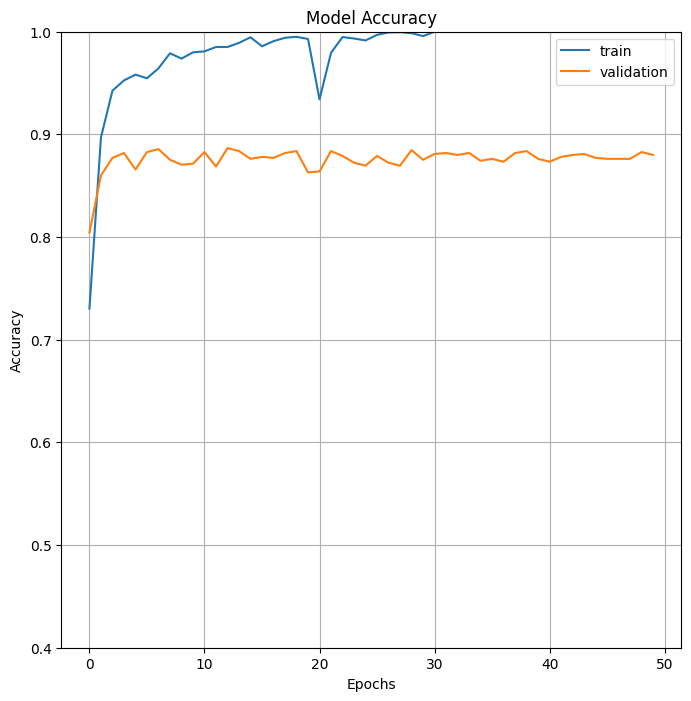

In [ ]:
plotter_lib.figure(figsize=(8, 8))
epochs_range= range(epochs)
plotter_lib.plot( epochs_range, history.history['accuracy'], label="Training Accuracy")
plotter_lib.plot(epochs_range, history.history['val_accuracy'], label="Validation Accuracy")
plotter_lib.axis(ymin=0.4,ymax=1)
plotter_lib.grid()
plotter_lib.title('Model Accuracy')
plotter_lib.ylabel('Accuracy')
plotter_lib.xlabel('Epochs')
plotter_lib.legend(['train', 'validation'])

In [3]:
from numpy import genfromtxt
one_fpr = genfromtxt('/content/drive/MyDrive/results/one_fpr.csv', delimiter=',')
one_tpr = genfromtxt('/content/drive/MyDrive/results/one_tpr.csv', delimiter=',')
two_fpr = genfromtxt('/content/drive/MyDrive/results/two_fpr.csv', delimiter=',')
two_tpr = genfromtxt('/content/drive/MyDrive/results/two_tpr.csv', delimiter=',')
three_fpr = genfromtxt('/content/drive/MyDrive/results/three_fpr.csv', delimiter=',')
three_tpr = genfromtxt('/content/drive/MyDrive/results/three_tpr.csv', delimiter=',')
four_fpr = genfromtxt('/content/drive/MyDrive/results/four_fpr.csv', delimiter=',')
four_tpr = genfromtxt('/content/drive/MyDrive/results/four_tpr.csv', delimiter=',')
five_fpr = genfromtxt('/content/drive/MyDrive/results/five_fpr.csv', delimiter=',')
five_tpr = genfromtxt('/content/drive/MyDrive/results/five_tpr.csv', delimiter=',')
six_fpr = genfromtxt('/content/drive/MyDrive/results/six_fpr.csv', delimiter=',')
six_tpr = genfromtxt('/content/drive/MyDrive/results/six_tpr.csv', delimiter=',')
seven_fpr = genfromtxt('/content/drive/MyDrive/results/seven_fpr.csv', delimiter=',')
seven_tpr = genfromtxt('/content/drive/MyDrive/results/seven_tpr.csv', delimiter=',')

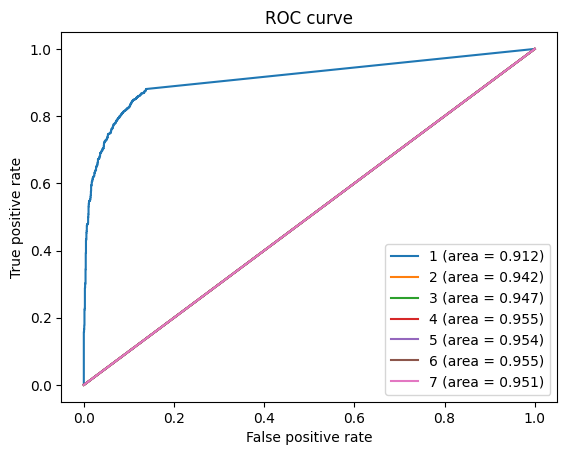

In [6]:
import matplotlib.pyplot as plt
from sklearn.metrics import auc
plt.figure(1)
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(one_fpr, one_tpr, label='1 (area = {:.3f})'.format(auc(one_fpr, one_tpr)))
plt.plot(two_fpr, two_fpr, label='2 (area = {:.3f})'.format(auc(two_fpr, two_tpr)))
plt.plot(three_fpr, three_fpr, label='3 (area = {:.3f})'.format(auc(three_fpr, three_tpr)))
plt.plot(four_fpr, four_fpr, label='4 (area = {:.3f})'.format(auc(four_fpr, four_tpr)))
plt.plot(five_fpr, five_fpr, label='5 (area = {:.3f})'.format(auc(five_fpr, five_tpr)))
plt.plot(six_fpr, six_fpr, label='6 (area = {:.3f})'.format(auc(six_fpr, six_tpr)))
plt.plot(seven_fpr, seven_fpr, label='7 (area = {:.3f})'.format(auc(seven_fpr, seven_tpr)))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best')
plt.show()

In [7]:
! curl https://raw.githubusercontent.com/nogibjj/DallE2-ai-generator-scott/main/model_preprossing/fake_image_class.csv > /content/drive/MyDrive/image_categories.csv

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  642k  100  642k    0     0  1554k      0 --:--:-- --:--:-- --:--:-- 1551k


In [8]:
import pandas as pd

df = pd.read_csv("/content/drive/MyDrive/image_categories.csv")

In [9]:
df.head()

,0,1,2,3,4
0,00000.png,neutral,0,Woman,asian
1,00002.png,neutral,0,Woman,black
2,00004.png,neutral,0,Man,latino hispanic
3,00006.png,pos,0,Woman,white
4,00008.png,pos,1,Woman,asian


In [11]:
import os
test_image_fake = os.listdir("/content/drive/MyDrive/sample_images/fake/")

In [12]:
test_image_fake[:5]

['21598.png', '21551.png', '21513.png', '21605.png', '21570.png']

In [13]:
len(test_image_fake)

2105

In [115]:
df_sample = df.loc[df["0"].isin(test_image_fake)]

In [116]:
df_sample_glasses = df_sample.loc[df_sample["1"] == "neg"]

In [117]:
df_sample_glasses.shape

(413, 5)

In [118]:
glasses_images = list(df_sample_glasses["0"])

In [119]:
!rm /content/drive/MyDrive/categories_images/fake/*

In [120]:
test_image_fake_category = os.listdir("/content/drive/MyDrive/categories_images/fake/")
len(test_image_fake_category)

0

In [121]:
import shutil

for file_name in glasses_images[:200]:
   shutil.copy("/content/drive/MyDrive/sample_images/fake/"+file_name, "/content/drive/MyDrive/categories_images/fake/"+file_name)

In [122]:
test_ds_categories = tflow.keras.preprocessing.image_dataset_from_directory(
  "/content/drive/MyDrive/categories_images",
  seed=1,
  label_mode='binary',
  image_size=(180, 180),
  batch_size=200, shuffle=False)

Found 200 files belonging to 2 classes.
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorSliceDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op TensorSliceDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op BatchDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0


In [123]:
eval = demo_resnet_model.evaluate(test_ds_categories)

Executing op DatasetCardinality in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DatasetCardinality in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Equal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GreaterEqual in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity i

In [39]:
eval

[0.42976081371307373, 0.8050000071525574, 0.0, 0.0, 0.0, 0.0, 161.0, 39.0, 0.0]

In [ ]:
demo_resnet_model.save('/content/drive/MyDrive/resnet_model')

In [ ]:
demo_resnet_model = tf.keras.models.load_model('/content/drive/MyDrive/resnet_model')

In [ ]:
pretrained_model_for_demo= tflow.keras.applications.ResNet50(include_top=False,
                   input_shape=(180,180,3),
                   pooling='avg',classes=2,
                   weights='imagenet')

for each_layer in pretrained_model_for_demo.layers:
        each_layer.trainable=False

In [125]:
import cv2
import matplotlib.pyplot as plt
from scipy.ndimage import zoom
from tensorflow.keras.applications.resnet50 import preprocess_input, decode_predictions
img = cv2.imread('/content/drive/MyDrive/pic_use/26151.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = cv2.resize(img, (180, 180))
X = np.expand_dims(img, axis=0).astype(np.float32)

In [126]:
from tensorflow.keras.models import Model
conv_output = pretrained_model_for_demo.get_layer("conv5_block3_out").output
pred_ouptut = pretrained_model_for_demo.get_layer("avg_pool").output
model = Model(pretrained_model_for_demo.input, outputs=[conv_output, pred_ouptut])

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0


In [127]:
pretrained_model_for_demo.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 180, 180, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 186, 186, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 90, 90, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 90, 90, 64)   256         ['conv1_conv[0][0]']      

In [128]:
conv, pred = model.predict(X)

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMa

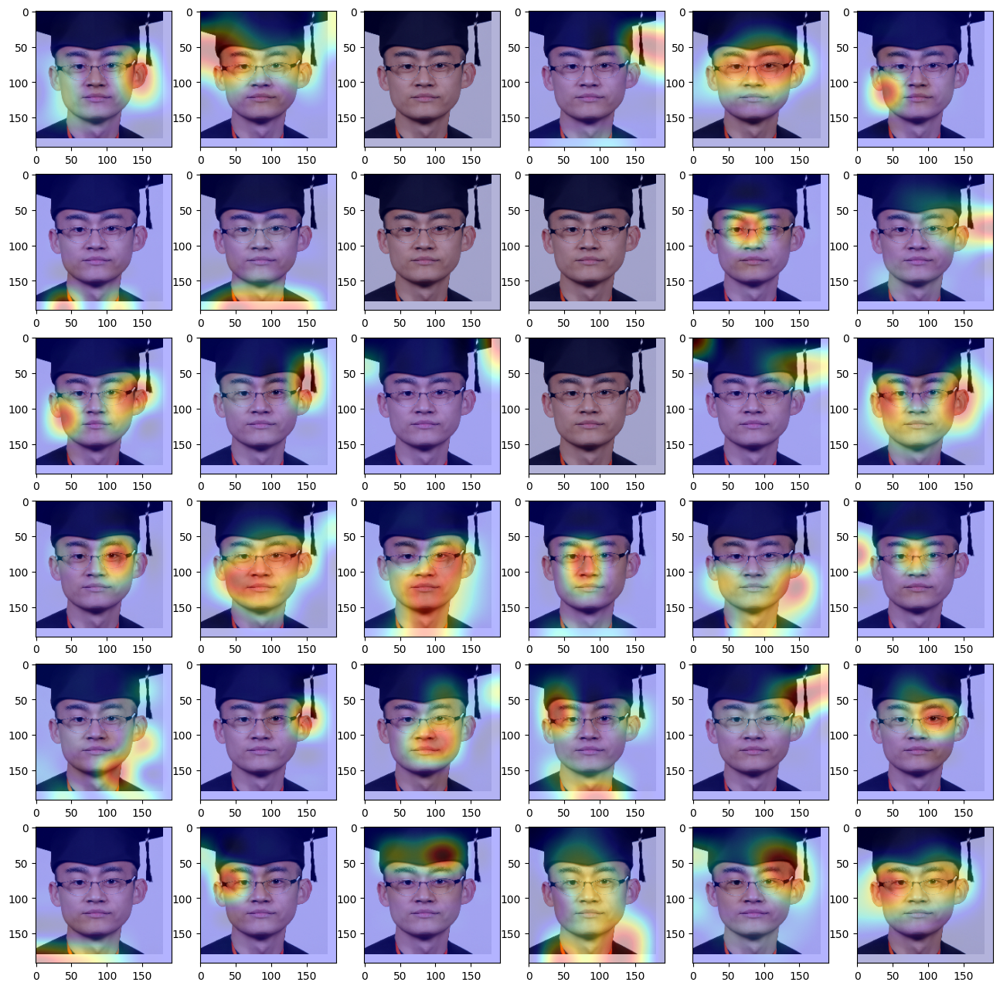

In [129]:
scale = 224 / 7
plt.figure(figsize=(16, 16))
for i in range(36):
    plt.subplot(6, 6, i + 1)
    plt.imshow(img)
    plt.imshow(zoom(conv[0, :,:,i], zoom=(scale, scale)), cmap='jet', alpha=0.3)

In [ ]:
  demo_resnet_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 2048)              23587712  
                                                                 
 flatten (Flatten)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 512)               1049088   
                                                                 
 dense_1 (Dense)             (None, 1)                 513       
                                                                 
Total params: 24,637,313
Trainable params: 1,049,601
Non-trainable params: 23,587,712
_________________________________________________________________


In [ ]:
layer_outputs = [layer.output for layer in pretrained_model_for_demo.layers]

In [ ]:
feature_map_model = tf.keras.models.Model(inputs=pretrained_model_for_demo.input, outputs=layer_outputs)

In [ ]:
feature_maps = feature_map_model.predict(X)

1/1 [==============================] - 1s 1s/step


In [ ]:
layer_names = [layer.name for layer in pretrained_model_for_demo.layers]

In [ ]:
for layer_name, feature_map in zip(layer_names, feature_maps):print(f"The shape of the {layer_name} is =======>> {feature_map.shape}")

The shape of the input_1 is =======>> (1, 180, 180, 3)
The shape of the conv1_pad is =======>> (1, 186, 186, 3)
The shape of the conv1_conv is =======>> (1, 90, 90, 64)
The shape of the conv1_bn is =======>> (1, 90, 90, 64)
The shape of the conv1_relu is =======>> (1, 90, 90, 64)
The shape of the pool1_pad is =======>> (1, 92, 92, 64)
The shape of the pool1_pool is =======>> (1, 45, 45, 64)
The shape of the conv2_block1_1_conv is =======>> (1, 45, 45, 64)
The shape of the conv2_block1_1_bn is =======>> (1, 45, 45, 64)
The shape of the conv2_block1_1_relu is =======>> (1, 45, 45, 64)
The shape of the conv2_block1_2_conv is =======>> (1, 45, 45, 64)
The shape of the conv2_block1_2_bn is =======>> (1, 45, 45, 64)
The shape of the conv2_block1_2_relu is =======>> (1, 45, 45, 64)
The shape of the conv2_block1_0_conv is =======>> (1, 45, 45, 256)
The shape of the conv2_block1_3_conv is =======>> (1, 45, 45, 256)
The shape of the conv2_block1_0_bn is =======>> (1, 45, 45, 256)
The shape of th

<ipython-input-32-125fb3c232fe>:9: RuntimeWarning: invalid value encountered in true_divide
  feature_image/= feature_image.std ()
<ipython-input-32-125fb3c232fe>:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure( figsize=(scale * k, scale) )


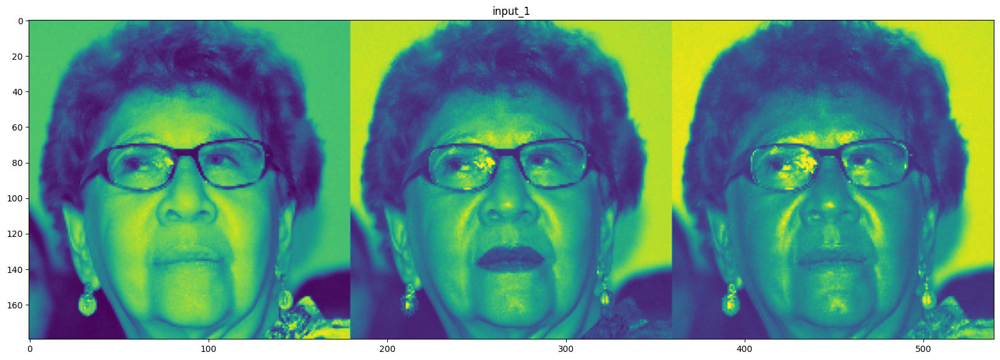

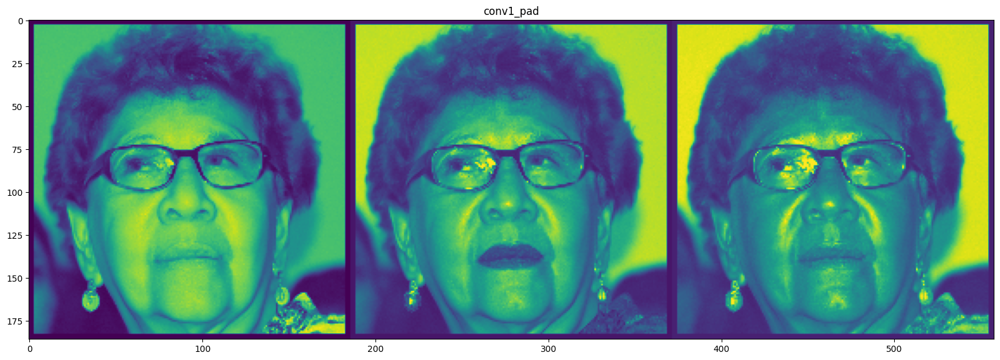

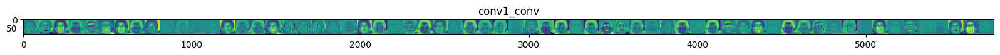

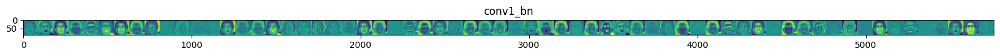

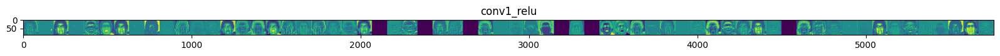

...

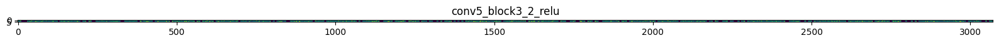

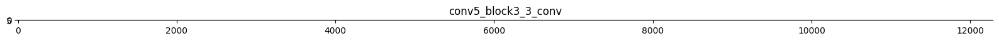

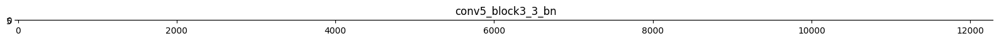

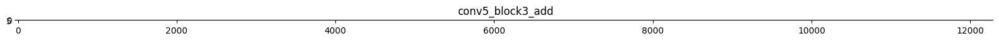

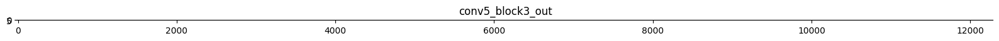

In [ ]:
for layer_name, feature_map in zip(layer_names, feature_maps):  
  if len(feature_map.shape) == 4:
      k = feature_map.shape[-1]  
      size=feature_map.shape[1]
      image_belt = np.zeros((size, size * k))
      for i in range(k):
        feature_image = feature_map[0, :, :, i]
        feature_image-= feature_image.mean()
        feature_image/= feature_image.std ()
        feature_image*=  64
        feature_image+= 128
        feature_image= np.clip(feature_image, 0, 255).astype('uint8')
        image_belt[:, i * size : (i + 1) * size] = feature_image 
      scale = 20. / k
      plt.figure( figsize=(scale * k, scale) )
      plt.title ( layer_name )
      plt.grid  ( False )
      plt.imshow( image_belt, aspect='auto')

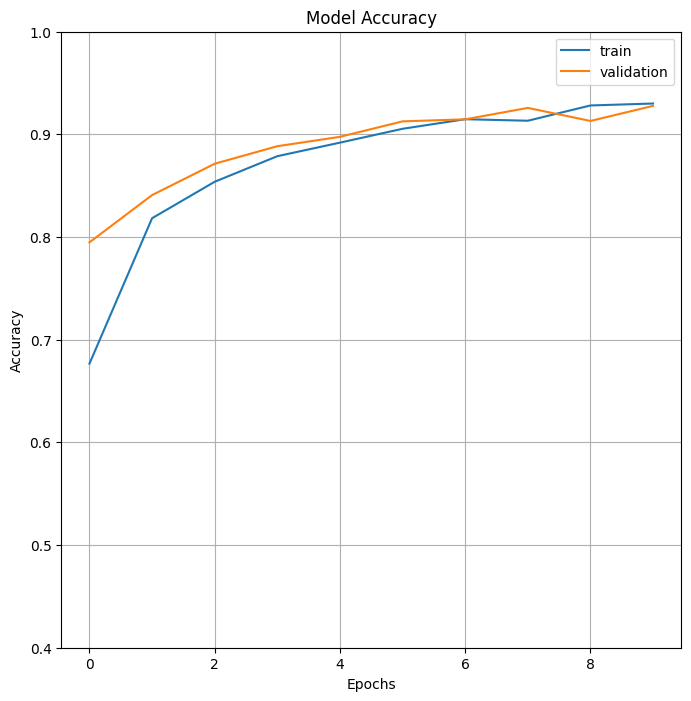

In [ ]:
plotter_lib.figure(figsize=(8, 8))

epochs_range= range(epochs)

plotter_lib.plot( epochs_range, history.history['accuracy'], label="Training Accuracy")

plotter_lib.plot(epochs_range, history.history['val_accuracy'], label="Validation Accuracy")

plotter_lib.axis(ymin=0.4,ymax=1)

plotter_lib.grid()

plotter_lib.title('Model Accuracy')

plotter_lib.ylabel('Accuracy')

plotter_lib.xlabel('Epochs')

plotter_lib.legend(['train', 'validation'])

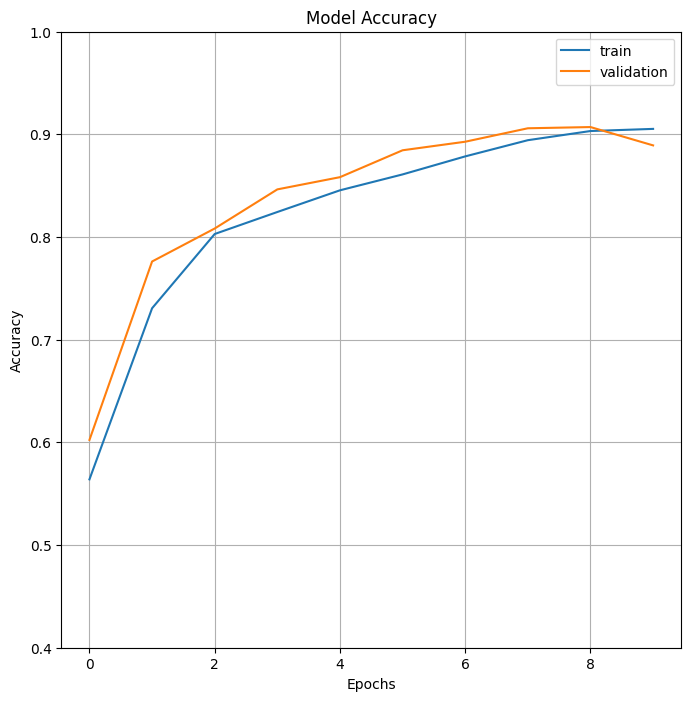

In [ ]:
plotter_lib.figure(figsize=(8, 8))

epochs_range= range(epochs)

plotter_lib.plot( epochs_range, history.history['accuracy'], label="Training Accuracy")

plotter_lib.plot(epochs_range, history.history['val_accuracy'], label="Validation Accuracy")

plotter_lib.axis(ymin=0.4,ymax=1)

plotter_lib.grid()

plotter_lib.title('Model Accuracy')

plotter_lib.ylabel('Accuracy')

plotter_lib.xlabel('Epochs')

plotter_lib.legend(['train', 'validation'])

In [ ]:
!curl "https://awscli.amazonaws.com/awscli-exe-linux-x86_64.zip" -o "awscliv2.zip"
!unzip awscliv2.zip
!sudo ./aws/install

In [ ]:
!aws configure

AWS Access Key ID [None]: ***REMOVED***
AWS Secret Access Key [None]: ***REMOVED***
Default region name [None]: us-east-1
Default output format [None]: 


In [ ]:
!aws s3 cp s3://dalle2images/fake /content/drive/MyDrive/images/fake/ --recursive